# Credit Card Fraud Detection <br>
The datasets contains transactions made by credit cards in September 2013 by european cardholders. This dataset presents transactions that occurred in two days, where we have 492 frauds out of 284,807 transactions. The dataset is highly unbalanced, the positive class (frauds) account for 0.172% of all transactions. I decided to proceed to an undersampling strategy to re-balance the class.

It contains only numerical input variables which are the result of a PCA transformation. Unfortunately, due to confidentiality issues, details about the original features and more background information is not available.

In [1]:
#Packages import
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [2]:
# Load the dataset    EDA
credit_card_df = pd.read_csv("/Users/aswathchary/Desktop/Northeastern University/NEU Course Work/DAMG6105-Data Science Engineering/Data Science_FinalProj_Aswath_Janani/data/creditcard.csv")
print("Total number of records: "+str(credit_card_df.shape[0]))
print("Total number of columns: "+str(credit_card_df.shape[1]))
credit_card_df.head(10)


Total number of records: 284807
Total number of columns: 31


,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0
5,2.0,-0.425966,0.960523,1.141109,-0.168252,0.420987,-0.029728,0.476201,0.260314,-0.568671,...,-0.208254,-0.559825,-0.026398,-0.371427,-0.232794,0.105915,0.253844,0.081080,3.67,0
6,4.0,1.229658,0.141004,0.045371,1.202613,0.191881,0.272708,-0.005159,0.081213,0.464960,...,-0.167716,-0.270710,-0.154104,-0.780055,0.750137,-0.257237,0.034507,0.005168,4.99,0
7,7.0,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,40.80,0
8,7.0,-0.894286,0.286157,-0.113192,-0.271526,2.669599,3.721818,0.370145,0.851084,-0.392048,...,-0.073425,-0.268092,-0.204233,1.011592,0.373205,-0.384157,0.011747,0.142404,93.20,0
9,9.0,-0.338262,1.119593,1.044367,-0.222187,0.499361,-0.246761,0.651583,0.069539,-0.736727,...,-0.246914,-0.633753,-0.120794,-0.385050,-0.069733,0.094199,0.246219,0.083076,3.68,0


As shown above, the data consists of <b> 284807 rows </b> and <b> 31 columns </b>. <br>
The variable <b> Class </b> is the <b> dependant variable</b>.

## Data preprocessing

In [3]:
pd.set_option('display.float_format', lambda x: '%.5f' % x) # to disable scientific notation
credit_card_df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,...,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000
mean,94813.85958,0.00000,0.00000,-0.00000,0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,88.34962,0.00173
std,47488.14595,1.95870,1.65131,1.51626,1.41587,1.38025,1.33227,1.23709,1.19435,1.09863,...,0.73452,0.72570,0.62446,0.60565,0.52128,0.48223,0.40363,0.33008,250.12011,0.04153
min,0.00000,-56.40751,-72.71573,-48.32559,-5.68317,-113.74331,-26.16051,-43.55724,-73.21672,-13.43407,...,-34.83038,-10.93314,-44.80774,-2.83663,-10.29540,-2.60455,-22.56568,-15.43008,0.00000,0.00000
25%,54201.50000,-0.92037,-0.59855,-0.89036,-0.84864,-0.69160,-0.76830,-0.55408,-0.20863,-0.64310,...,-0.22839,-0.54235,-0.16185,-0.35459,-0.31715,-0.32698,-0.07084,-0.05296,5.60000,0.00000
50%,84692.00000,0.01811,0.06549,0.17985,-0.01985,-0.05434,-0.27419,0.04010,0.02236,-0.05143,...,-0.02945,0.00678,-0.01119,0.04098,0.01659,-0.05214,0.00134,0.01124,22.00000,0.00000
75%,139320.50000,1.31564,0.80372,1.02720,0.74334,0.61193,0.39856,0.57044,0.32735,0.59714,...,0.18638,0.52855,0.14764,0.43953,0.35072,0.24095,0.09105,0.07828,77.16500,0.00000
max,172792.00000,2.45493,22.05773,9.38256,16.87534,34.80167,73.30163,120.58949,20.00721,15.59499,...,27.20284,10.50309,22.52841,4.58455,7.51959,3.51735,31.61220,33.84781,25691.16000,1.00000


The variables V1 to V28 consists of values within a very small range - between -120 to 120. However, the variables <b> Time & Amount </b> seems to have a bigger range of values. <b> Hence, we can scale both the variables before modelling.</b><br>

The <b>StandardScaler function from sklearn </b> can be used for the same.

In [4]:
from sklearn import preprocessing
scaler = preprocessing.StandardScaler()

#Standardise the values in 'Amount' variable
credit_card_df['Time_std'] = scaler.fit_transform(credit_card_df['Time'].values.reshape(-1,1))
credit_card_df['Amount_std'] = scaler.fit_transform(credit_card_df['Amount'].values.reshape (-1,1))

#removing Time and Amount feature
credit_card_df.drop(["Time","Amount"], axis=1, inplace=True)

In [5]:
# Lets check the range of values after applying standard scaler
credit_card_df.describe()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V22,V23,V24,V25,V26,V27,V28,Class,Time_std,Amount_std
count,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,...,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000,284807.00000
mean,0.00000,0.00000,-0.00000,0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,...,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00173,-0.00000,0.00000
std,1.95870,1.65131,1.51626,1.41587,1.38025,1.33227,1.23709,1.19435,1.09863,1.08885,...,0.72570,0.62446,0.60565,0.52128,0.48223,0.40363,0.33008,0.04153,1.00000,1.00000
min,-56.40751,-72.71573,-48.32559,-5.68317,-113.74331,-26.16051,-43.55724,-73.21672,-13.43407,-24.58826,...,-10.93314,-44.80774,-2.83663,-10.29540,-2.60455,-22.56568,-15.43008,0.00000,-1.99658,-0.35323
25%,-0.92037,-0.59855,-0.89036,-0.84864,-0.69160,-0.76830,-0.55408,-0.20863,-0.64310,-0.53543,...,-0.54235,-0.16185,-0.35459,-0.31715,-0.32698,-0.07084,-0.05296,0.00000,-0.85521,-0.33084
50%,0.01811,0.06549,0.17985,-0.01985,-0.05434,-0.27419,0.04010,0.02236,-0.05143,-0.09292,...,0.00678,-0.01119,0.04098,0.01659,-0.05214,0.00134,0.01124,0.00000,-0.21315,-0.26527
75%,1.31564,0.80372,1.02720,0.74334,0.61193,0.39856,0.57044,0.32735,0.59714,0.45392,...,0.52855,0.14764,0.43953,0.35072,0.24095,0.09105,0.07828,0.00000,0.93722,-0.04472
max,2.45493,22.05773,9.38256,16.87534,34.80167,73.30163,120.58949,20.00721,15.59499,23.74514,...,10.50309,22.52841,4.58455,7.51959,3.51735,31.61220,33.84781,1.00000,1.64206,102.36224


In [6]:
# Check for missing values
credit_card_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   V1          284807 non-null  float64
 1   V2          284807 non-null  float64
 2   V3          284807 non-null  float64
 3   V4          284807 non-null  float64
 4   V5          284807 non-null  float64
 5   V6          284807 non-null  float64
 6   V7          284807 non-null  float64
 7   V8          284807 non-null  float64
 8   V9          284807 non-null  float64
 9   V10         284807 non-null  float64
 10  V11         284807 non-null  float64
 11  V12         284807 non-null  float64
 12  V13         284807 non-null  float64
 13  V14         284807 non-null  float64
 14  V15         284807 non-null  float64
 15  V16         284807 non-null  float64
 16  V17         284807 non-null  float64
 17  V18         284807 non-null  float64
 18  V19         284807 non-null  float64
 19  V2

There are no missing values in the dataset. Hence, data imputation is not required.

## Dependent variable distribution

In [7]:
print('Non Frauds', round(credit_card_df['Class'].value_counts()[0]/len(credit_card_df) * 100,2), '% of the dataset')
print('Frauds', round(credit_card_df['Class'].value_counts()[1]/len(credit_card_df) * 100,2), '% of the dataset')

Non Frauds 99.83 % of the dataset
Frauds 0.17 % of the dataset


<AxesSubplot:xlabel='Class', ylabel='count'>

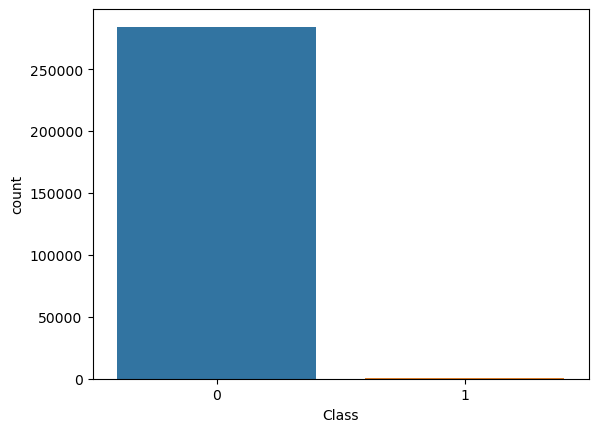

In [8]:
sns.countplot(x="Class", data=credit_card_df)

<b>The dataset is highly imbalanced !</b> Most of the transactions are non-fraud. If we use this data as the base for our predictive models and analysis we might get a lot of errors and our algorithms will probably overfit since it will "assume" that most transactions are not fraud. 

## Resampling to handle imbalance

Dealing with imbalanced datasets entails strategies such as improving classification algorithms or balancing classes in the training data (data preprocessing) before providing the data as input to the machine learning algorithm. The later technique is preferred as it has wider application.<br>

The main objective of balancing classes is to either increasing the frequency of the minority class or decreasing the frequency of the majority class. This is done in order to obtain approximately the same number of instances for both the classes

The simplest resampling method is using the undersampling technique which randomly selecting examples from the majority class and deleting them from the training dataset. This is referred to as random undersampling. <br>

Although simple and effective, a limitation of this technique is that examples are removed without any concern for how useful or important they might be in determining the decision boundary between the classes. This means it is possible, or even likely, that useful information will be deleted.

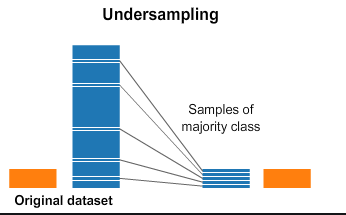

For resampling methods, we can use the <b>imblearn package</b> which comes in-built with various resampling strategies. <br>

<b><i>When we use any sampling technique, we divide the data first into train & test sets and then apply sampling on the training data only. Once the model is trained, we evaluate the model on the test set that contains only the original samples.</i></b>

In [9]:
from sklearn.model_selection import train_test_split

# define the input columns and target columns
cols = credit_card_df.columns.tolist()
cols = [c for c in cols if c not in ["Class"]]
target = "Class"

#define X and Y
X = credit_card_df[cols]
Y = credit_card_df[target]

X_train, X_test, y_train, y_test = train_test_split(X, Y, stratify=Y, test_size=0.25)

In [10]:
import imblearn
from imblearn.under_sampling import RandomUnderSampler 
undersample = RandomUnderSampler(sampling_strategy=0.4)

#undersample the training data
X_train_undersampled, Y_train_undersampled = undersample.fit_resample(X_train, y_train)

In [11]:
print("Class variable distribution after undersampling:\n"+str(Y_train_undersampled.value_counts()))

Class variable distribution after undersampling:
0    922
1    369
Name: Class, dtype: int64


## Model development

We can explore several machine learning classification models in order to find which one performs best on our data. The following models will be used:

- Logistic regression
- Random Forest Classifier
- Support Vector Classifier
- Gradient Boosting Classifier

The methodology used to train each model is as follows:

- Select the set of hyperparameters to tune for each model.
- Define the metric we'll get when measuring the performance of a model. In this case, we'll use the accuracy. (The final metric of choice will be the AUROC score of the model since accuracy is not a good metric for imbalanced classification).
- Perform a Randomized Search Cross Validation process in order to find the hyperparameter region in which we get higher values of accuracy.
- Use a Grid Search Cross Validation process to exhaustively find the best combination of hyperparameters around the best region identified using Randomized Search Cross Validation.
- Evaluate the models on the test set and choose the best model based on the evaluation metrics.

In [12]:
#importing packages for modeling
from sklearn.linear_model import LogisticRegression
from sklearn import svm
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier

from sklearn import metrics
from sklearn.metrics import classification_report, accuracy_score
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import auc
from sklearn.metrics import precision_recall_curve

from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import ShuffleSplit
from pprint import pprint

In [13]:
# Turn the values into an array for feeding the classification algorithms.
X_train = X_train_undersampled.values
y_train = Y_train_undersampled.values

In [14]:
# Let's implement the classifiers without tuning any hyperparameters (Baseline models)

classifiers = {
    "LogisiticRegression": LogisticRegression(),
    "SupportVectorClassifier": SVC(),
    "RandomForestClassifier": RandomForestClassifier(),
    "GradientBoostingClassifier": GradientBoostingClassifier()
}

In [15]:
# We will use 5-fold cross validation to check our model performance scores
from sklearn.model_selection import cross_val_score


for key, classifier in classifiers.items():
    classifier.fit(X_train, y_train)
    training_score = cross_val_score(classifier, X_train, y_train, cv=5)
    print("Classifiers: ", classifier.__class__.__name__, "has a training score of", round(training_score.mean(), 2) * 100, "% accuracy score")

Classifiers:  LogisticRegression has a training score of 96.0 % accuracy score
Classifiers:  SVC has a training score of 95.0 % accuracy score
Classifiers:  RandomForestClassifier has a training score of 96.0 % accuracy score
Classifiers:  GradientBoostingClassifier has a training score of 95.0 % accuracy score


The baseline scores of the models looks very promising. All the models yield a very good training score. We can further use hyperparameter tuning to improve the performance of each model and further evaluate on the test set to choose our final model.

## Logistic Regression

In [16]:
base_lr_model = LogisticRegression(random_state = 8)

print('Parameters currently in use:\n')
pprint(base_lr_model.get_params())

Parameters currently in use:

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': 8,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}


### Hyperparameter tuning using Cross Validation


The following hyperparameters will be tuned:

- <i><b>C</b></i> : Inverse of regularization strength. Smaller values specify stronger regularization.
- <i><b>class_weight</b></i> : Weights associated with classes.
- <i><b>penalty</b></i> : Used to specify the norm used in the penalization. The ‘newton-cg’, ‘sag’ and ‘lbfgs’ solvers support only l2 penalties.

In [17]:
# C
C = [float(x) for x in np.linspace(start = 0.1, stop = 1, num = 10)]

# solver
solver = ['liblinear'] #For small datasets, ‘liblinear’ is a good choice.
 
# class_weight
class_weight = ['balanced', None]

# penalty
penalty = ['l1','l2']

# Create the random grid
random_grid = {'C': C,
               'solver': solver,
               'class_weight': class_weight,
               'penalty': penalty}

pprint(random_grid)

{'C': [0.1,
       0.2,
       0.30000000000000004,
       0.4,
       0.5,
       0.6,
       0.7000000000000001,
       0.8,
       0.9,
       1.0],
 'class_weight': ['balanced', None],
 'penalty': ['l1', 'l2'],
 'solver': ['liblinear']}


#### Randomized Search Cross Validation

In [18]:
# Definition of the random search
random_search_LRC = RandomizedSearchCV(estimator=base_lr_model,
                                   param_distributions=random_grid,
                                   n_iter=30,
                                   scoring='accuracy',
                                   cv=3, 
                                   verbose=1, 
                                   random_state=8)

# Fit the random search model
random_search_LRC.fit(X_train, y_train)

Fitting 3 folds for each of 30 candidates, totalling 90 fits


RandomizedSearchCV(cv=3, estimator=LogisticRegression(random_state=8),
                   n_iter=30,
                   param_distributions={'C': [0.1, 0.2, 0.30000000000000004,
                                              0.4, 0.5, 0.6, 0.7000000000000001,
                                              0.8, 0.9, 1.0],
                                        'class_weight': ['balanced', None],
                                        'penalty': ['l1', 'l2'],
                                        'solver': ['liblinear']},
                   random_state=8, scoring='accuracy', verbose=1)

In [19]:
print("The best hyperparameters from Random Search are:")
print(random_search_LRC.best_params_)
print("")
print("The mean accuracy of a model with these hyperparameters is:")
print(random_search_LRC.best_score_)

The best hyperparameters from Random Search are:
{'solver': 'liblinear', 'penalty': 'l1', 'class_weight': None, 'C': 0.4}

The mean accuracy of a model with these hyperparameters is:
0.9558481267648699


#### Grid Search Cross Validation <br>

Do a more centered search around the hyperparameter values obtained using Randomized Search CV

In [20]:
# Create the parameter grid based on the results of random search 
C = [float(x) for x in np.linspace(start = 0.7, stop = 1, num = 10)]
solver = ['liblinear']
class_weight = [None]
penalty = ['l1']

param_grid = {'C': C,
               'solver': solver,
               'class_weight': class_weight,
               'penalty': penalty}


# Manually create the splits in CV in order to be able to fix a random_state (GridSearchCV doesn't have that argument)
cv_sets = ShuffleSplit(n_splits = 3, test_size = .33, random_state = 8)

# Instantiate the grid search model
grid_search_LRC = GridSearchCV(estimator=base_lr_model, 
                           param_grid=param_grid,
                           scoring='accuracy',
                           cv=cv_sets,
                           verbose=1)

# Fit the grid search to the data
grid_search_LRC.fit(X_train, y_train)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


GridSearchCV(cv=ShuffleSplit(n_splits=3, random_state=8, test_size=0.33, train_size=None),
             estimator=LogisticRegression(random_state=8),
             param_grid={'C': [0.7, 0.7333333333333333, 0.7666666666666666,
                               0.7999999999999999, 0.8333333333333333,
                               0.8666666666666667, 0.9, 0.9333333333333333,
                               0.9666666666666667, 1.0],
                         'class_weight': [None], 'penalty': ['l1'],
                         'solver': ['liblinear']},
             scoring='accuracy', verbose=1)

In [21]:
print("The best hyperparameters from Grid Search are:")
print(grid_search_LRC.best_params_)
print("")
print("The mean accuracy of a model with these hyperparameters is:")
print(grid_search_LRC.best_score_)

The best hyperparameters from Grid Search are:
{'C': 0.7, 'class_weight': None, 'penalty': 'l1', 'solver': 'liblinear'}

The mean accuracy of a model with these hyperparameters is:
0.9523809523809524


In [22]:
best_lrc = grid_search_LRC.best_estimator_
best_lrc.fit(X_train,y_train)

#Predict on test data
lrc_pred = best_lrc.predict(X_test)

#### Logistic regression model - Test data evaluation

The test accuracy is: 
0.989143563383051


Classification report
              precision    recall  f1-score   support

   Non-fraud       1.00      0.99      0.99     71079
       Fraud       0.13      0.92      0.23       123

    accuracy                           0.99     71202
   macro avg       0.56      0.95      0.61     71202
weighted avg       1.00      0.99      0.99     71202





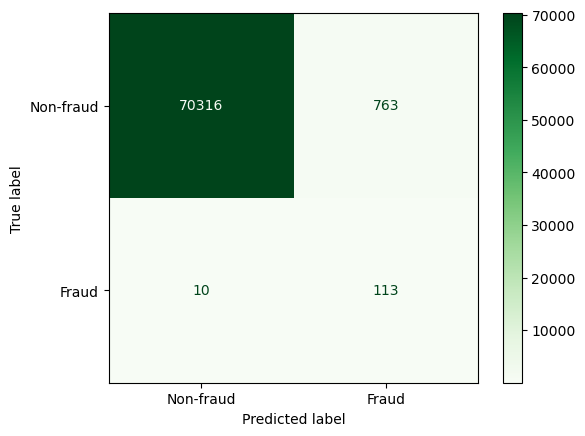

In [23]:
# Test accuracy
print("The test accuracy is: ")
print(accuracy_score(y_test, lrc_pred))
print("\n")

# Classification report
print("Classification report")
print(classification_report(y_test,lrc_pred, target_names=['Non-fraud', 'Fraud']))
print("\n")

#Confusion matrix
print(plot_confusion_matrix(best_lrc, X_test, y_test, values_format = '',cmap=plt.cm.Greens, display_labels=['Non-fraud','Fraud']))

AUC Logistic Regression : 0.9848470446887393


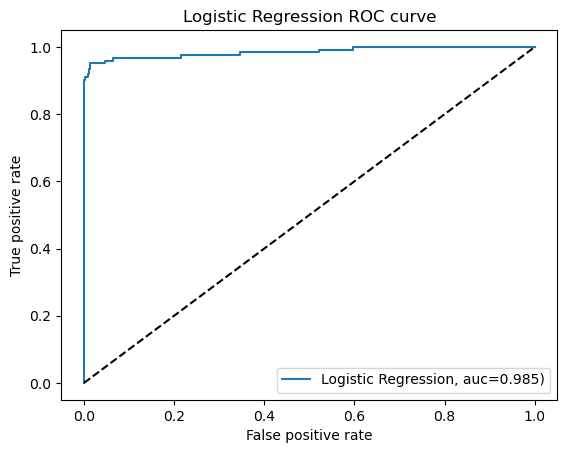

In [24]:
# Plot ROC AUC curve
#AUC
lrc_pred_proba = best_lrc.predict_proba(X_test)[::,1]
lrc_fpr, lrc_tpr, _ = metrics.roc_curve(y_test,  lrc_pred_proba)
LRC_auc = metrics.roc_auc_score(y_test, lrc_pred_proba)
print("AUC Logistic Regression :", LRC_auc)

#ROC
plt.plot(lrc_fpr,lrc_tpr,label="Logistic Regression, auc={:.3f})".format(LRC_auc))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('Logistic Regression ROC curve')
plt.legend(loc=4)
plt.show()

## Support Vector Classifier

In [25]:
base_svc = svm.SVC(random_state=8)

print('Parameters currently in use:\n')
pprint(base_svc.get_params())

Parameters currently in use:

{'C': 1.0,
 'break_ties': False,
 'cache_size': 200,
 'class_weight': None,
 'coef0': 0.0,
 'decision_function_shape': 'ovr',
 'degree': 3,
 'gamma': 'scale',
 'kernel': 'rbf',
 'max_iter': -1,
 'probability': False,
 'random_state': 8,
 'shrinking': True,
 'tol': 0.001,
 'verbose': False}


#### Hyperparameter Tuning using Cross Validation

The following hyperparameters will be tuned:<br>
- <b><i>C</i></b>: Penalty parameter C of the error term.<br>
- <b><i>kernel</i></b>: Specifies the kernel type to be used in the algorithm.<br>
- <b><i>gamma</i></b>: Kernel coefficient.<br>
- <b><i>degree</i></b>: Degree of the polynomial kernel function.<br>

#### Randomized Search Cross Validation

In [26]:
# C
C = [.0001, .001, .01]

# gamma
gamma = [.0001, .001, .01, .1, 1, 10, 100]

# degree
degree = [1, 2, 3, 4, 5]

# kernel
kernel = ['linear', 'rbf', 'poly']

# probability
probability = [True]

# Create the random grid
random_grid = {'C': C,
              'kernel': kernel,
              'gamma': gamma,
              'degree': degree,
              'probability': probability
             }

pprint(random_grid)

{'C': [0.0001, 0.001, 0.01],
 'degree': [1, 2, 3, 4, 5],
 'gamma': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100],
 'kernel': ['linear', 'rbf', 'poly'],
 'probability': [True]}


In [27]:
# First create the base model to tune
svc = svm.SVC(random_state=8)

# Definition of the random search
random_search_SVC = RandomizedSearchCV(estimator=base_svc,
                                   param_distributions=random_grid,
                                   n_iter=50,
                                   scoring='accuracy',
                                   cv=3, 
                                   verbose=1, 
                                   random_state=8)

# Fit the random search model
random_search_SVC.fit(X_train, y_train)

Fitting 3 folds for each of 50 candidates, totalling 150 fits


RandomizedSearchCV(cv=3, estimator=SVC(random_state=8), n_iter=50,
                   param_distributions={'C': [0.0001, 0.001, 0.01],
                                        'degree': [1, 2, 3, 4, 5],
                                        'gamma': [0.0001, 0.001, 0.01, 0.1, 1,
                                                  10, 100],
                                        'kernel': ['linear', 'rbf', 'poly'],
                                        'probability': [True]},
                   random_state=8, scoring='accuracy', verbose=1)

In [28]:
print("The best hyperparameters from Random Search are:")
print(random_search_SVC.best_params_)
print("")
print("The mean accuracy of a model with these hyperparameters is:")
print(random_search_SVC.best_score_)

The best hyperparameters from Random Search are:
{'probability': True, 'kernel': 'poly', 'gamma': 0.1, 'degree': 2, 'C': 0.01}

The mean accuracy of a model with these hyperparameters is:
0.9527437543840717


#### Grid Search Cross Validation

In [29]:
# Create the parameter grid based on the results of random search 
C = [.0001, .001, .01]
degree = [3, 4, 5]
gamma = [0.0001, 0.001, 0.01]
probability = [True]
kernel = ['linear']

param_grid = [
  {'C': C, 'kernel':['linear'], 'probability':probability},
  {'C': C, 'kernel':['poly'], 'degree':degree, 'probability':probability},
  {'C': C, 'kernel':['rbf'], 'gamma':gamma, 'probability':probability}
]


# Manually create the splits in CV in order to be able to fix a random_state (GridSearchCV doesn't have that argument)
cv_sets = ShuffleSplit(n_splits = 3, test_size = .33, random_state = 8)

# Instantiate the grid search model
grid_search_SVC = GridSearchCV(estimator=base_svc, 
                           param_grid=param_grid,
                           scoring='accuracy',
                           cv=cv_sets,
                           verbose=1)

# Fit the grid search to the data
grid_search_SVC.fit(X_train, y_train)

Fitting 3 folds for each of 21 candidates, totalling 63 fits


GridSearchCV(cv=ShuffleSplit(n_splits=3, random_state=8, test_size=0.33, train_size=None),
             estimator=SVC(random_state=8),
             param_grid=[{'C': [0.0001, 0.001, 0.01], 'kernel': ['linear'],
                          'probability': [True]},
                         {'C': [0.0001, 0.001, 0.01], 'degree': [3, 4, 5],
                          'kernel': ['poly'], 'probability': [True]},
                         {'C': [0.0001, 0.001, 0.01],
                          'gamma': [0.0001, 0.001, 0.01], 'kernel': ['rbf'],
                          'probability': [True]}],
             scoring='accuracy', verbose=1)

In [30]:
print("The best hyperparameters from Grid Search are:")
print(grid_search_SVC.best_params_)
print("")
print("The mean accuracy of a model with these hyperparameters is:")
print(grid_search_SVC.best_score_)

The best hyperparameters from Grid Search are:
{'C': 0.01, 'kernel': 'linear', 'probability': True}

The mean accuracy of a model with these hyperparameters is:
0.9476971116315379


In [31]:
best_svc = grid_search_SVC.best_estimator_
best_svc.fit(X_train,y_train)

#Predict on test data
svc_pred = best_svc.predict(X_test)

#### Support Vector Classifier model - Test data evaluation

The test accuracy is: 
0.9948316058537682


Classification report
              precision    recall  f1-score   support

   Non-fraud       1.00      0.99      1.00     71079
       Fraud       0.24      0.91      0.38       123

    accuracy                           0.99     71202
   macro avg       0.62      0.95      0.69     71202
weighted avg       1.00      0.99      1.00     71202





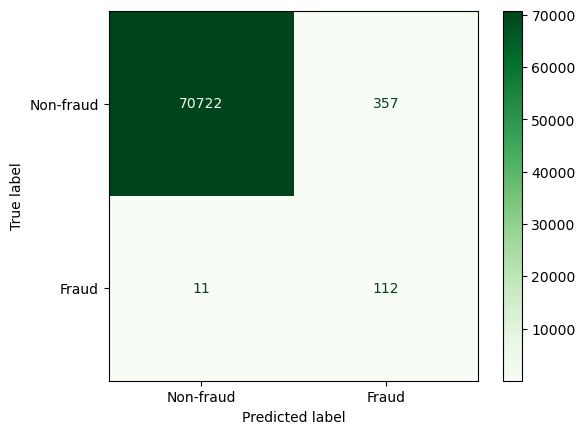

In [32]:
# Test accuracy
print("The test accuracy is: ")
print(accuracy_score(y_test, svc_pred))
print("\n")

# Classification report
print("Classification report")
print(classification_report(y_test,svc_pred, target_names=['Non-fraud', 'Fraud']))
print("\n")

#Confusion matrix
print(plot_confusion_matrix(best_svc, X_test, y_test, values_format = '',cmap=plt.cm.Greens, display_labels=['Non-fraud','Fraud']))

AUC Support Vector Classifier : 0.9824523657805692


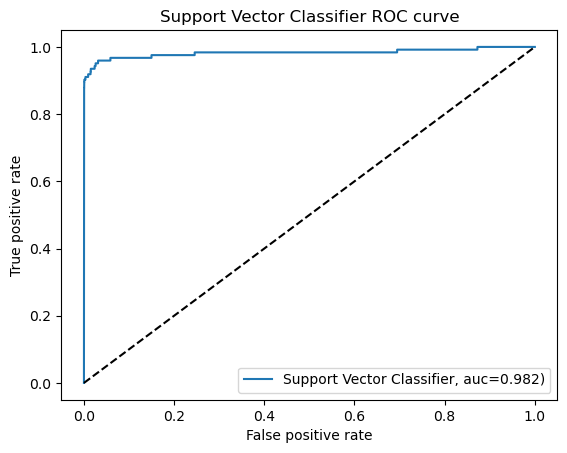

In [33]:
# Plot ROC AUC curve
#AUC
svc_pred_proba = best_svc.predict_proba(X_test)[::,1]
svc_fpr, svc_tpr, _ = metrics.roc_curve(y_test,  svc_pred_proba)
svc_auc = metrics.roc_auc_score(y_test, svc_pred_proba)
print("AUC Support Vector Classifier :", svc_auc)

#ROC
plt.plot(svc_fpr,svc_tpr,label="Support Vector Classifier, auc={:.3f})".format(svc_auc))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('Support Vector Classifier ROC curve')
plt.legend(loc=4)
plt.show()

### Random Forest Classifier

In [34]:
base_rfc = RandomForestClassifier(random_state = 8)

print('Parameters currently in use:\n')
pprint(base_rfc.get_params())

Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 8,
 'verbose': 0,
 'warm_start': False}


#### Hyperparameter Tuning for Cross Validation

The following hyperparameters will be tuned:

- <b><i>n_estimators</i></b> = number of trees in the forest.
- <b><i>max_features</i></b> = max number of features considered for splitting a node
- <b><i>max_depth</i></b> = max number of levels in each decision tree
- <b><i>min_samples_split</i></b> = min number of data points placed in a node before the node is split
- <b><i>min_samples_leaf</i></b> = min number of data points allowed in a leaf node
- <b><i>bootstrap</i></b> = method for sampling data points (with or without replacement)

#### Randomized Search Cross Validation

In [35]:
# n_estimators
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 600, num = 3)]

# max_features
max_features = ['auto', 'sqrt']

# max_depth
max_depth = [int(x) for x in np.linspace(20, 100, num = 5)]
max_depth.append(None)

# min_samples_split
min_samples_split = [2, 5, 10]

# min_samples_leaf
min_samples_leaf = [1, 2, 4]

# bootstrap
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

pprint(random_grid)

{'bootstrap': [True, False],
 'max_depth': [20, 40, 60, 80, 100, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600]}


In [36]:
# Definition of the random search
random_search_RFC = RandomizedSearchCV(estimator=base_rfc,
                                   param_distributions=random_grid,
                                   n_iter=50,
                                   scoring='accuracy',
                                   cv=3, 
                                   verbose=1, 
                                   random_state=8,
                                       n_jobs=-1)

# Fit the random search model
random_search_RFC.fit(X_train, y_train)

Fitting 3 folds for each of 50 candidates, totalling 150 fits


/Users/aswathchary/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aswathchary/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aswathchary/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remo

RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(random_state=8),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [20, 40, 60, 80, 100,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [200, 400, 600]},
                   random_state=8, scoring='accuracy', verbose=1)

In [37]:
print("The best hyperparameters from Random Search are:")
print(random_search_RFC.best_params_)
print("")
print("The mean accuracy of a model with these hyperparameters is:")
print(random_search_RFC.best_score_)

The best hyperparameters from Random Search are:
{'n_estimators': 400, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 20, 'bootstrap': False}

The mean accuracy of a model with these hyperparameters is:
0.9542905447939711


#### Grid Search Cross Validation

In [38]:
# Create the parameter grid based on the results of random search 
bootstrap = [False]
max_depth = [60, 70, 80]
max_features = ['sqrt']
min_samples_leaf = [1, 2, 4]
min_samples_split = [2, 5, 10]
n_estimators = [200]

param_grid = {
    'bootstrap': bootstrap,
    'max_depth': max_depth,
    'max_features': max_features,
    'min_samples_leaf': min_samples_leaf,
    'min_samples_split': min_samples_split,
    'n_estimators': n_estimators
}


# Manually create the splits in CV in order to be able to fix a random_state (GridSearchCV doesn't have that argument)
cv_sets = ShuffleSplit(n_splits = 3, test_size = .33, random_state = 8)

# Instantiate the grid search model
grid_search_RFC = GridSearchCV(estimator=base_rfc, 
                           param_grid=param_grid,
                           scoring='accuracy',
                           cv=cv_sets,
                           verbose=1,
                           n_jobs=-1)

# Fit the grid search to the data
grid_search_RFC.fit(X_train, y_train)

Fitting 3 folds for each of 27 candidates, totalling 81 fits


GridSearchCV(cv=ShuffleSplit(n_splits=3, random_state=8, test_size=0.33, train_size=None),
             estimator=RandomForestClassifier(random_state=8), n_jobs=-1,
             param_grid={'bootstrap': [False], 'max_depth': [60, 70, 80],
                         'max_features': ['sqrt'],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [200]},
             scoring='accuracy', verbose=1)

In [39]:
print("The best hyperparameters from Grid Search are:")
print(grid_search_RFC.best_params_)
print("")
print("The mean accuracy of a model with these hyperparameters is:")
print(grid_search_RFC.best_score_)

The best hyperparameters from Grid Search are:
{'bootstrap': False, 'max_depth': 60, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 200}

The mean accuracy of a model with these hyperparameters is:
0.9578454332552693


In [40]:
best_rfc = grid_search_RFC.best_estimator_
best_rfc.fit(X_train,y_train)

#Predict on test data
rfc_pred = best_rfc.predict(X_test)

#### Random Forest Classifier model - Test data evaluation

The test accuracy is: 
0.9941996011347995


Classification report
              precision    recall  f1-score   support

   Non-fraud       1.00      0.99      1.00     71079
       Fraud       0.22      0.92      0.35       123

    accuracy                           0.99     71202
   macro avg       0.61      0.96      0.68     71202
weighted avg       1.00      0.99      1.00     71202





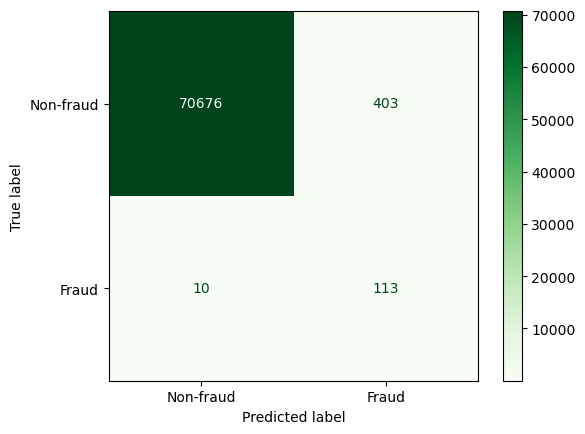

In [41]:
# Test accuracy
print("The test accuracy is: ")
print(accuracy_score(y_test, rfc_pred))
print("\n")

# Classification report
print("Classification report")
print(classification_report(y_test,rfc_pred, target_names=['Non-fraud', 'Fraud']))
print("\n")

#Confusion matrix
print(plot_confusion_matrix(best_rfc, X_test, y_test, values_format = '',cmap=plt.cm.Greens, display_labels=['Non-fraud','Fraud']))

AUC Random Forest Classifier : 0.9862020010484156


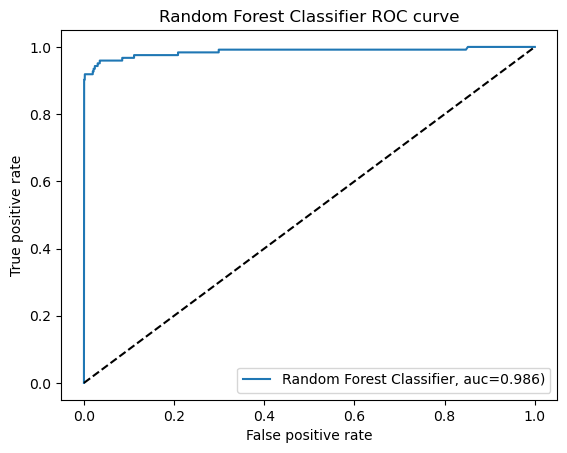

In [42]:
# Plot ROC AUC curve
#AUC
rfc_pred_proba = best_rfc.predict_proba(X_test)[::,1]
rfc_fpr, rfc_tpr, _ = metrics.roc_curve(y_test,  rfc_pred_proba)
rfc_auc = metrics.roc_auc_score(y_test, rfc_pred_proba)
print("AUC Random Forest Classifier :", rfc_auc)

#ROC
plt.plot(rfc_fpr,rfc_tpr,label="Random Forest Classifier, auc={:.3f})".format(rfc_auc))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('Random Forest Classifier ROC curve')
plt.legend(loc=4)
plt.show()

## Gradient Boosting Classifier

In [43]:
base_gbc = GradientBoostingClassifier(random_state = 8)

print('Parameters currently in use:\n')
pprint(base_gbc.get_params())

Parameters currently in use:

{'ccp_alpha': 0.0,
 'criterion': 'friedman_mse',
 'init': None,
 'learning_rate': 0.1,
 'loss': 'log_loss',
 'max_depth': 3,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_iter_no_change': None,
 'random_state': 8,
 'subsample': 1.0,
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}


#### Hyperparameter Tuning for Cross Validation


The following hyperparameters will be tuned:

Tree-related hyperparameters:

- <b><i>n_estimators</i></b> = number of trees in the forest.
- <b><i>max_features</i></b> = max number of features considered for splitting a node
- <b><i>max_depth</i></b> = max number of levels in each decision tree
- <b><i>min_samples_split</i></b> = min number of data points placed in a node before the node is split
- <b><i>min_samples_leaf</i></b> = min number of data points allowed in a leaf node

Boosting-related hyperparameters:

- <b><i>learning_rate</i></b> = learning rate shrinks the contribution of each tree by learning_rate.
- <b><i>subsample</i></b> = the fraction of samples to be used for fitting the individual base learners.

#### Randomized Search Cross Validation

In [44]:
# n_estimators
n_estimators = [200, 400, 600]

# max_features
max_features = ['auto', 'sqrt']

# max_depth
max_depth = [10, 40]
max_depth.append(None)

# min_samples_split
min_samples_split = [10, 30, 50]

# min_samples_leaf
min_samples_leaf = [1, 2, 4]

# learning rate
learning_rate = [.1, .5]

# subsample
subsample = [.5, 1.]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'learning_rate': learning_rate,
               'subsample': subsample}

pprint(random_grid)

{'learning_rate': [0.1, 0.5],
 'max_depth': [10, 40, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [10, 30, 50],
 'n_estimators': [200, 400, 600],
 'subsample': [0.5, 1.0]}


In [45]:
# Definition of the random search
random_search_GBC = RandomizedSearchCV(estimator=base_gbc,
                                   param_distributions=random_grid,
                                   n_iter=50,
                                   scoring='accuracy',
                                   cv=3, 
                                   verbose=1, 
                                   random_state=8,
                                   n_jobs=-1)

# Fit the random search model
random_search_GBC.fit(X_train, y_train)

Fitting 3 folds for each of 50 candidates, totalling 150 fits


/Users/aswathchary/opt/anaconda3/lib/python3.9/site-packages/sklearn/tree/_classes.py:306: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/Users/aswathchary/opt/anaconda3/lib/python3.9/site-packages/sklearn/tree/_classes.py:306: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/Users/aswathchary/opt/anaconda3/lib/python3.9/site-packages/sklearn/tree/_classes.py:306: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/Users/aswathchary/opt/anaconda3/lib/python3.9/site-packages/sklearn/tree/_classes.py:306: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviou

RandomizedSearchCV(cv=3, estimator=GradientBoostingClassifier(random_state=8),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'learning_rate': [0.1, 0.5],
                                        'max_depth': [10, 40, None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [10, 30, 50],
                                        'n_estimators': [200, 400, 600],
                                        'subsample': [0.5, 1.0]},
                   random_state=8, scoring='accuracy', verbose=1)

In [46]:
print("The best hyperparameters from Random Search are:")
print(random_search_GBC.best_params_)
print("")
print("The mean accuracy of a model with these hyperparameters is:")
print(random_search_GBC.best_score_)

The best hyperparameters from Random Search are:
{'subsample': 0.5, 'n_estimators': 600, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 10, 'learning_rate': 0.5}

The mean accuracy of a model with these hyperparameters is:
0.9573985143617691


#### Grid Search Cross Validation

In [47]:
# Create the parameter grid based on the results of random search 
max_depth = [ 10, 15]
max_features = ['auto']
min_samples_leaf = [4]
min_samples_split = [10, 20, 50]
n_estimators = [600]
learning_rate = [.1, .5]
subsample = [1.]

param_grid = {
    'max_depth': max_depth,
    'max_features': max_features,
    'min_samples_leaf': min_samples_leaf,
    'min_samples_split': min_samples_split,
    'n_estimators': n_estimators,
    'learning_rate': learning_rate,
    'subsample': subsample

}


# Manually create the splits in CV in order to be able to fix a random_state (GridSearchCV doesn't have that argument)
cv_sets = ShuffleSplit(n_splits = 3, test_size = .33, random_state = 8)

# Instantiate the grid search model
grid_search_GBC = GridSearchCV(estimator=base_gbc, 
                           param_grid=param_grid,
                           scoring='accuracy',
                           cv=cv_sets,
                           verbose=1,
                           n_jobs=-1)

# Fit the grid search to the data
grid_search_GBC.fit(X_train, y_train)

Fitting 3 folds for each of 12 candidates, totalling 36 fits


/Users/aswathchary/opt/anaconda3/lib/python3.9/site-packages/sklearn/tree/_classes.py:306: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/Users/aswathchary/opt/anaconda3/lib/python3.9/site-packages/sklearn/tree/_classes.py:306: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/Users/aswathchary/opt/anaconda3/lib/python3.9/site-packages/sklearn/tree/_classes.py:306: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/Users/aswathchary/opt/anaconda3/lib/python3.9/site-packages/sklearn/tree/_classes.py:306: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviou

GridSearchCV(cv=ShuffleSplit(n_splits=3, random_state=8, test_size=0.33, train_size=None),
             estimator=GradientBoostingClassifier(random_state=8), n_jobs=-1,
             param_grid={'learning_rate': [0.1, 0.5], 'max_depth': [10, 15],
                         'max_features': ['auto'], 'min_samples_leaf': [4],
                         'min_samples_split': [10, 20, 50],
                         'n_estimators': [600], 'subsample': [1.0]},
             scoring='accuracy', verbose=1)

In [48]:
print("The best hyperparameters from Grid Search are:")
print(grid_search_GBC.best_params_)
print("")
print("The mean accuracy of a model with these hyperparameters is:")
print(grid_search_GBC.best_score_)

The best hyperparameters from Grid Search are:
{'learning_rate': 0.5, 'max_depth': 10, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 20, 'n_estimators': 600, 'subsample': 1.0}

The mean accuracy of a model with these hyperparameters is:
0.9562841530054644


In [49]:
best_gbc = grid_search_GBC.best_estimator_
best_gbc.fit(X_train,y_train)

#Predict on test data
gbc_pred = best_rfc.predict(X_test)

#### Gradient Boosting Classifier model - Test data evaluation

The test accuracy is: 
0.9941996011347995


Classification report
              precision    recall  f1-score   support

   Non-fraud       1.00      0.99      1.00     71079
       Fraud       0.22      0.92      0.35       123

    accuracy                           0.99     71202
   macro avg       0.61      0.96      0.68     71202
weighted avg       1.00      0.99      1.00     71202





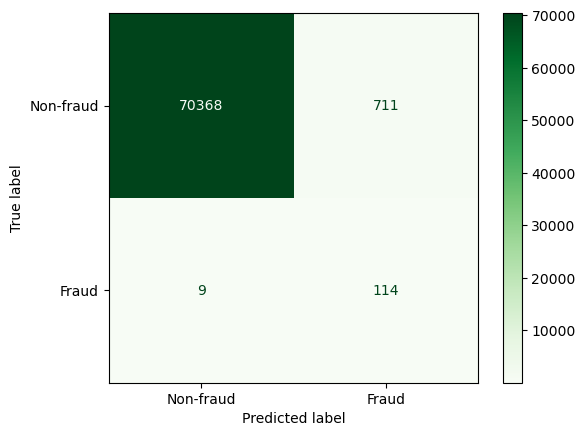

In [50]:
# Test accuracy
print("The test accuracy is: ")
print(accuracy_score(y_test, gbc_pred))
print("\n")

# Classification report
print("Classification report")
print(classification_report(y_test,gbc_pred, target_names=['Non-fraud', 'Fraud']))
print("\n")

#Confusion matrix
print(plot_confusion_matrix(best_gbc, X_test, y_test, values_format = '',cmap=plt.cm.Greens, display_labels=['Non-fraud','Fraud']))

AUC Gradient Boosting Classifier : 0.9870002654781117


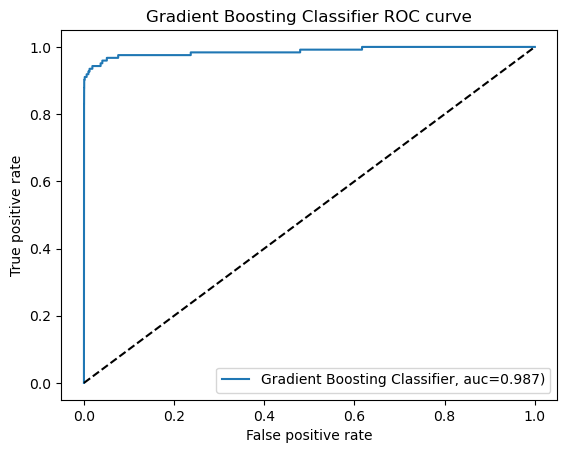

In [51]:
# Plot ROC AUC curve
#AUC
gbc_pred_proba = best_gbc.predict_proba(X_test)[::,1]
gbc_fpr, gbc_tpr, _ = metrics.roc_curve(y_test,  gbc_pred_proba)
gbc_auc = metrics.roc_auc_score(y_test, gbc_pred_proba)
print("AUC Gradient Boosting Classifier :", gbc_auc)

#ROC
plt.plot(gbc_fpr,gbc_tpr,label="Gradient Boosting Classifier, auc={:.3f})".format(gbc_auc))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('Gradient Boosting Classifier ROC curve')
plt.legend(loc=4)
plt.show()

- All the four models are extremely good in classifying a Fraud from Non-Fraud transaction.<br>
- The AUC Scores obtained are all above 0.96 which indicates that the predicting power of these models are very good with <b> Gradient Bosoting Classifier having the highest accuracy of 0.994 and AUC score of 0.983 on the test set</b>.

## Ensembling using Voting Classifier

<b>A Voting Classifier is a machine learning model that trains on an ensemble of numerous models and predicts an output (class) based on their highest probability of chosen class as the output.</b><br>

It simply aggregates the findings of each classifier passed into Voting Classifier and predicts the output class based on the highest majority of voting. The idea is instead of creating separate dedicated models and finding the accuracy for each them, we create a single model which trains by these models and predicts output based on their combined majority of voting for each output class.

Voting Classifier supports two types of votings.

- <b>Hard Voting</b>: In hard voting, the predicted output class is a class with the highest majority of votes i.e the class which had the highest probability of being predicted by each of the classifiers. Suppose three classifiers predicted the output class(A, A, B), so here the majority predicted A as output. Hence A will be the final prediction.<br>
- <b>Soft Voting</b>: In soft voting, the output class is the prediction based on the average of probability given to that class. Suppose given some input to three models, the prediction probability for class A = (0.30, 0.47, 0.53) and B = (0.20, 0.32, 0.40). So the average for class A is 0.4333 and B is 0.3067, the winner is clearly class A because it had the highest probability averaged by each classifier.

<b><i>Note: We will use Soft Voting since we need the predicted probabilities to get the AUC scores.</i></b>

In [52]:
from sklearn.ensemble import VotingClassifier

## Model 1 - RFC, SVC and GBC

In [53]:
"""Model 1 - Using RFC,GBC and SVC"""
models= []
models.append(('RFC',best_rfc))
models.append(('SVC',best_svc))
models.append(('GBC',best_gbc))

vot_classifier_1 = VotingClassifier(estimators=models,voting='soft')
vot_classifier_1.fit(X_train,y_train)

VotingClassifier(estimators=[('RFC',
                              RandomForestClassifier(bootstrap=False,
                                                     max_depth=60,
                                                     min_samples_leaf=4,
                                                     n_estimators=200,
                                                     random_state=8)),
                             ('SVC',
                              SVC(C=0.01, kernel='linear', probability=True,
                                  random_state=8)),
                             ('GBC',
                              GradientBoostingClassifier(learning_rate=0.5,
                                                         max_depth=10,
                                                         max_features='auto',
                                                         min_samples_leaf=4,
                                                         min_samples_split=20,
                                                         n_estimators=600,
                                                         random_state=8))],
                 voting='soft')

The test accuracy is: 
0.993328839077554


Classification report
              precision    recall  f1-score   support

   Non-fraud       1.00      0.99      1.00     71079
       Fraud       0.20      0.92      0.32       123

    accuracy                           0.99     71202
   macro avg       0.60      0.96      0.66     71202
weighted avg       1.00      0.99      1.00     71202





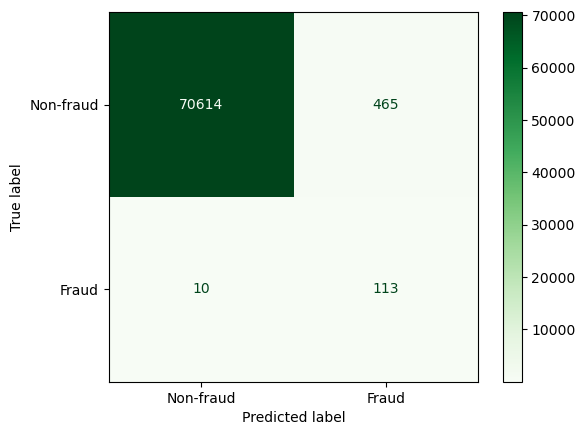

In [54]:
vot_classifier_1_pred = vot_classifier_1.predict(X_test)

# Test accuracy
print("The test accuracy is: ")
print(accuracy_score(y_test, vot_classifier_1_pred))
print("\n")

# Classification report
print("Classification report")
print(classification_report(y_test,vot_classifier_1_pred, target_names=['Non-fraud', 'Fraud']))
print("\n")

#Confusion matrix
print(plot_confusion_matrix(vot_classifier_1, X_test, y_test, values_format = '',cmap=plt.cm.Greens, display_labels=['Non-fraud','Fraud']))

AUC Voting Classifier 1 : 0.9878320435169066


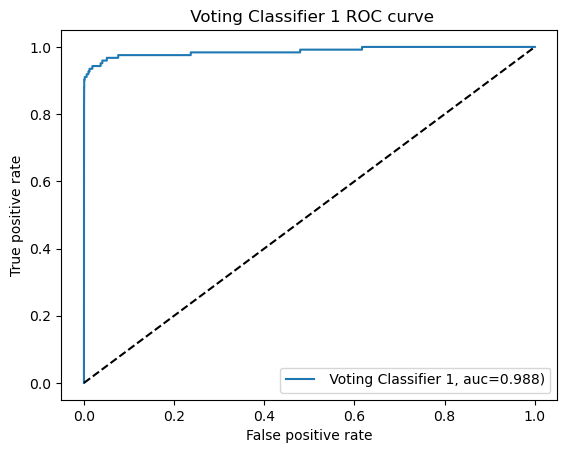

In [55]:
# Plot ROC AUC curve
#AUC
vot_classifier_1_pred_proba = vot_classifier_1.predict_proba(X_test)[::,1]
vot_classifier_1_fpr, vot_classifier_1_tpr, _ = metrics.roc_curve(y_test,  vot_classifier_1_pred_proba)
vot_classifier_1_auc = metrics.roc_auc_score(y_test, vot_classifier_1_pred_proba)
print("AUC Voting Classifier 1 :", vot_classifier_1_auc)

#ROC
plt.plot(gbc_fpr,gbc_tpr,label=" Voting Classifier 1, auc={:.3f})".format(vot_classifier_1_auc))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title(' Voting Classifier 1 ROC curve')
plt.legend(loc=4)
plt.show()

## Model 2 - Using, RFC, SVC, LRC

In [56]:
"""Model 2 - Using RFC,SVC and LRC"""
models= []
models.append(('RFC',best_rfc))
models.append(('SVC',best_svc))
models.append(('LRC',best_lrc))

vot_classifier_2 = VotingClassifier(estimators=models,voting='soft')
vot_classifier_2.fit(X_train,y_train)

VotingClassifier(estimators=[('RFC',
                              RandomForestClassifier(bootstrap=False,
                                                     max_depth=60,
                                                     min_samples_leaf=4,
                                                     n_estimators=200,
                                                     random_state=8)),
                             ('SVC',
                              SVC(C=0.01, kernel='linear', probability=True,
                                  random_state=8)),
                             ('LRC',
                              LogisticRegression(C=0.7, penalty='l1',
                                                 random_state=8,
                                                 solver='liblinear'))],
                 voting='soft')

The test accuracy is: 
0.9924721215696188


Classification report
              precision    recall  f1-score   support

   Non-fraud       1.00      0.99      1.00     71079
       Fraud       0.18      0.91      0.29       123

    accuracy                           0.99     71202
   macro avg       0.59      0.95      0.65     71202
weighted avg       1.00      0.99      1.00     71202





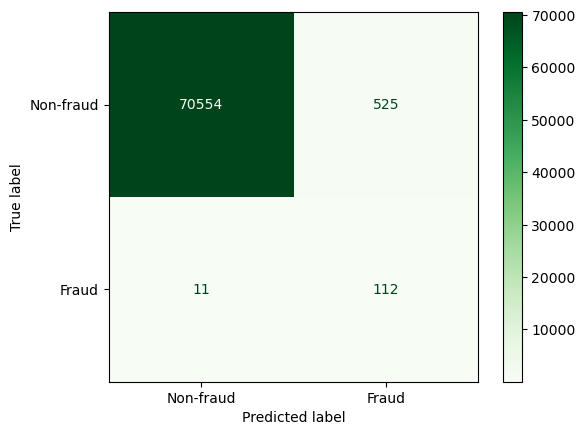

In [57]:
vot_classifier_2_pred = vot_classifier_2.predict(X_test)

# Test accuracy
print("The test accuracy is: ")
print(accuracy_score(y_test, vot_classifier_2_pred))
print("\n")

# Classification report
print("Classification report")
print(classification_report(y_test,vot_classifier_2_pred, target_names=['Non-fraud', 'Fraud']))
print("\n")

#Confusion matrix
print(plot_confusion_matrix(vot_classifier_2, X_test, y_test, values_format = '',cmap=plt.cm.Greens, display_labels=['Non-fraud','Fraud']))

AUC Voting Classifier 2 : 0.9880435338350766


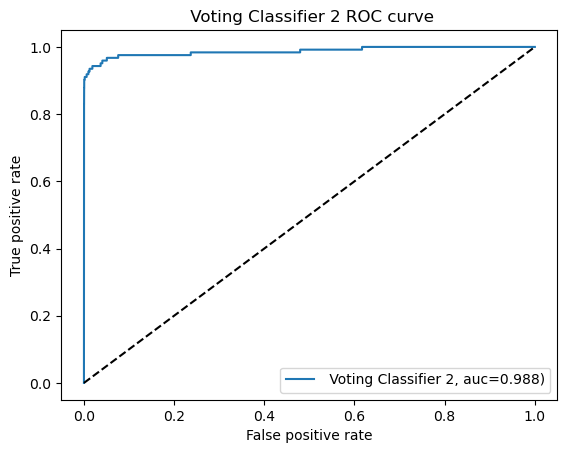

In [58]:
# Plot ROC AUC curve
#AUC
vot_classifier_2_pred_proba = vot_classifier_2.predict_proba(X_test)[::,1]
vot_classifier_2_fpr, vot_classifier_2_tpr, _ = metrics.roc_curve(y_test,  vot_classifier_2_pred_proba)
vot_classifier_2_auc = metrics.roc_auc_score(y_test, vot_classifier_2_pred_proba)
print("AUC Voting Classifier 2 :", vot_classifier_2_auc)

#ROC
plt.plot(gbc_fpr,gbc_tpr,label=" Voting Classifier 2, auc={:.3f})".format(vot_classifier_2_auc))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title(' Voting Classifier 2 ROC curve')
plt.legend(loc=4)
plt.show()

## Model 3 - Using SVC, LRC and GBC

In [59]:
"""Model 3 - Using SVC, LRC and GBC"""
models= []
models.append(('SVC',best_svc))
models.append(('LRC',best_lrc))
models.append(('GBC',best_gbc))

vot_classifier_3 = VotingClassifier(estimators=models,voting='soft')
vot_classifier_3.fit(X_train,y_train)

VotingClassifier(estimators=[('SVC',
                              SVC(C=0.01, kernel='linear', probability=True,
                                  random_state=8)),
                             ('LRC',
                              LogisticRegression(C=0.7, penalty='l1',
                                                 random_state=8,
                                                 solver='liblinear')),
                             ('GBC',
                              GradientBoostingClassifier(learning_rate=0.5,
                                                         max_depth=10,
                                                         max_features='auto',
                                                         min_samples_leaf=4,
                                                         min_samples_split=20,
                                                         n_estimators=600,
                                                         random_state=8))],
                 voting='soft')

The test accuracy is: 
0.9930760371899666


Classification report
              precision    recall  f1-score   support

   Non-fraud       1.00      0.99      1.00     71079
       Fraud       0.19      0.91      0.31       123

    accuracy                           0.99     71202
   macro avg       0.59      0.95      0.65     71202
weighted avg       1.00      0.99      1.00     71202





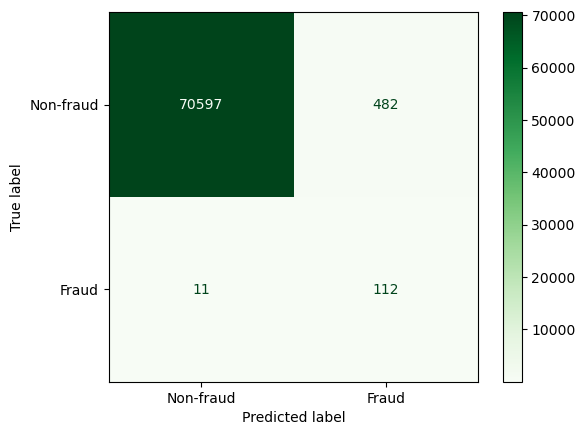

In [60]:
vot_classifier_3_pred = vot_classifier_3.predict(X_test)

# Test accuracy
print("The test accuracy is: ")
print(accuracy_score(y_test, vot_classifier_3_pred))
print("\n")

# Classification report
print("Classification report")
print(classification_report(y_test,vot_classifier_3_pred, target_names=['Non-fraud', 'Fraud']))
print("\n")

#Confusion matrix
print(plot_confusion_matrix(vot_classifier_3, X_test, y_test, values_format = '',cmap=plt.cm.Greens, display_labels=['Non-fraud','Fraud']))

AUC Voting Classifier 3 : 0.9889426822348246


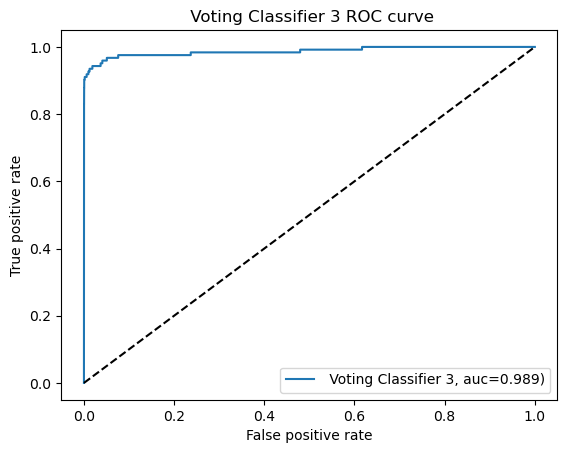

In [61]:
# Plot ROC AUC curve
#AUC
vot_classifier_3_pred_proba = vot_classifier_3.predict_proba(X_test)[::,1]
vot_classifier_3_fpr, vot_classifier_3_tpr, _ = metrics.roc_curve(y_test,  vot_classifier_3_pred_proba)
vot_classifier_3_auc = metrics.roc_auc_score(y_test, vot_classifier_3_pred_proba)
print("AUC Voting Classifier 3 :", vot_classifier_3_auc)

#ROC
plt.plot(gbc_fpr,gbc_tpr,label=" Voting Classifier 3, auc={:.3f})".format(vot_classifier_3_auc))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title(' Voting Classifier 3 ROC curve')
plt.legend(loc=4)
plt.show()

## Model 4 - Using RFC, LRC, GBC

In [62]:
"""Model 4 - Using RFC, LRC, GBC"""
models= []
models.append(('RFC',best_rfc))
models.append(('LRC',best_lrc))
models.append(('GBC',best_gbc))

vot_classifier_4 = VotingClassifier(estimators=models,voting='soft')
vot_classifier_4.fit(X_train,y_train)

VotingClassifier(estimators=[('RFC',
                              RandomForestClassifier(bootstrap=False,
                                                     max_depth=60,
                                                     min_samples_leaf=4,
                                                     n_estimators=200,
                                                     random_state=8)),
                             ('LRC',
                              LogisticRegression(C=0.7, penalty='l1',
                                                 random_state=8,
                                                 solver='liblinear')),
                             ('GBC',
                              GradientBoostingClassifier(learning_rate=0.5,
                                                         max_depth=10,
                                                         max_features='auto',
                                                         min_samples_leaf=4,
                                                         min_samples_split=20,
                                                         n_estimators=600,
                                                         random_state=8))],
                 voting='soft')

The test accuracy is: 
0.992682789809275


Classification report
              precision    recall  f1-score   support

   Non-fraud       1.00      0.99      1.00     71079
       Fraud       0.18      0.92      0.30       123

    accuracy                           0.99     71202
   macro avg       0.59      0.96      0.65     71202
weighted avg       1.00      0.99      1.00     71202





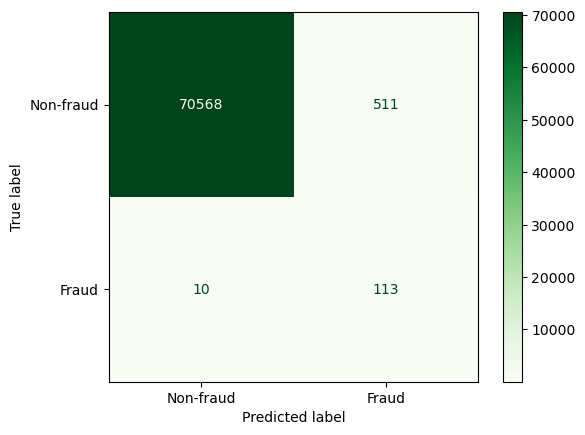

In [63]:
vot_classifier_4_pred = vot_classifier_4.predict(X_test)

# Test accuracy
print("The test accuracy is: ")
print(accuracy_score(y_test, vot_classifier_4_pred))
print("\n")

# Classification report
print("Classification report")
print(classification_report(y_test,vot_classifier_4_pred, target_names=['Non-fraud', 'Fraud']))
print("\n")

#Confusion matrix
print(plot_confusion_matrix(vot_classifier_4, X_test, y_test, values_format = '',cmap=plt.cm.Greens, display_labels=['Non-fraud','Fraud']))

AUC Voting Classifier 4 : 0.9881326365705307


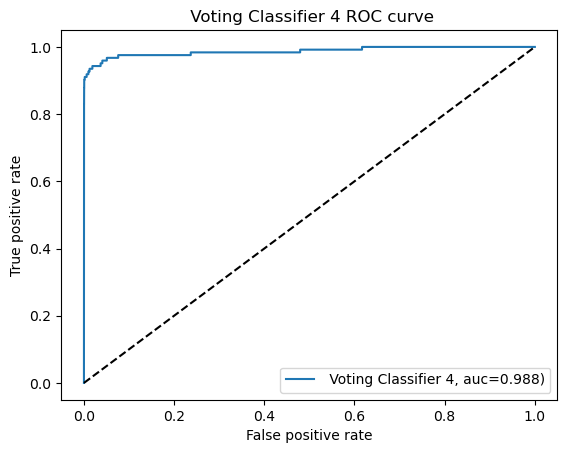

In [64]:
# Plot ROC AUC curve
#AUC
vot_classifier_4_pred_proba = vot_classifier_4.predict_proba(X_test)[::,1]
vot_classifier_4_fpr, vot_classifier_4_tpr, _ = metrics.roc_curve(y_test,  vot_classifier_4_pred_proba)
vot_classifier_4_auc = metrics.roc_auc_score(y_test, vot_classifier_4_pred_proba)
print("AUC Voting Classifier 4 :", vot_classifier_4_auc)

#ROC
plt.plot(gbc_fpr,gbc_tpr,label=" Voting Classifier 4, auc={:.3f})".format(vot_classifier_4_auc))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title(' Voting Classifier 4 ROC curve')
plt.legend(loc=4)
plt.show()

## Save all the models as pickle files

In [65]:
import pickle

#LRC
with open('/Users/aswathchary/Desktop/Northeastern University/NEU Course Work/DAMG6105-Data Science Engineering/Data Science_FinalProj_Aswath_Janani/Picklefiles/best_LRC_fraud_detection.pkl','wb') as model_file:
    pickle.dump(best_lrc,model_file)
#SVC    
with open('/Users/aswathchary/Desktop/Northeastern University/NEU Course Work/DAMG6105-Data Science Engineering/Data Science_FinalProj_Aswath_Janani/Picklefiles/best_SVC_fraud_detection.pkl','wb') as model_file:
    pickle.dump(best_svc,model_file)
#RFC
with open('/Users/aswathchary/Desktop/Northeastern University/NEU Course Work/DAMG6105-Data Science Engineering/Data Science_FinalProj_Aswath_Janani/Picklefiles/best_RFC_fraud_detection.pkl','wb') as model_file:
    pickle.dump(best_rfc,model_file)
#GBC  
with open('/Users/aswathchary/Desktop/Northeastern University/NEU Course Work/DAMG6105-Data Science Engineering/Data Science_FinalProj_Aswath_Janani/Picklefiles/best_GBC_fraud_detection.pkl','wb') as model_file:
    pickle.dump(best_gbc,model_file)
    
with open('/Users/aswathchary/Desktop/Northeastern University/NEU Course Work/DAMG6105-Data Science Engineering/Data Science_FinalProj_Aswath_Janani/Picklefiles/voting_ensemble_1_fraud_detection.pkl','wb') as model_file:
    pickle.dump(vot_classifier_1,model_file)
    
with open('/Users/aswathchary/Desktop/Northeastern University/NEU Course Work/DAMG6105-Data Science Engineering/Data Science_FinalProj_Aswath_Janani/Picklefiles/voting_ensemble_2_fraud_detection.pkl','wb') as model_file:
    pickle.dump(vot_classifier_2,model_file)
    
with open('/Users/aswathchary/Desktop/Northeastern University/NEU Course Work/DAMG6105-Data Science Engineering/Data Science_FinalProj_Aswath_Janani/Picklefiles/voting_ensemble_3_fraud_detection.pkl','wb') as model_file:
    pickle.dump(vot_classifier_3,model_file)
    
with open('/Users/aswathchary/Desktop/Northeastern University/NEU Course Work/DAMG6105-Data Science Engineering/Data Science_FinalProj_Aswath_Janani/Picklefiles/voting_ensemble_4_fraud_detection.pkl','wb') as model_file:
    pickle.dump(vot_classifier_4,model_file)
    

## Final Model Selection <br>

For selecting the final model, we can compare the model performance metrics for the various models. We can also look at the <b>Recall score </b> of our models to see how good the models are in classifying fraudulent and non-fraduelent transcations.

In [66]:
from sklearn.metrics import recall_score

In [67]:
# let us create a dataset with a model summary to compare models:
d = {
     'Model': 'Logistic Regression (LRC)',
     'Training Set Accuracy': accuracy_score(y_train, best_lrc.predict(X_train)),
     'Test Set Accuracy': accuracy_score(y_test, lrc_pred),
     'AUC Score' : LRC_auc,
     'Recall score': recall_score(y_test, lrc_pred)
    
}

df_models_lrc = pd.DataFrame(d, index=[0])
print(df_models_lrc)

                       Model  Training Set Accuracy  Test Set Accuracy  \
0  Logistic Regression (LRC)                0.96282            0.98914   

   AUC Score  Recall score  
0    0.98485       0.91870  


In [68]:
#SVC
d = {
     'Model': 'Support Vector Classifier (SVC)',
     'Training Set Accuracy': accuracy_score(y_train, best_svc.predict(X_train)),
     'Test Set Accuracy': accuracy_score(y_test, svc_pred),
     'AUC Score' : svc_auc,
     'Recall score': recall_score(y_test, svc_pred)
    
}

df_models_svc = pd.DataFrame(d, index=[0])

#RFC
d = {
     'Model': 'Random Forest Classifier (RFC)',
     'Training Set Accuracy': accuracy_score(y_train, best_rfc.predict(X_train)),
     'Test Set Accuracy': accuracy_score(y_test, rfc_pred),
     'AUC Score' : rfc_auc,
     'Recall score': recall_score(y_test, rfc_pred)
    
}

df_models_rfc = pd.DataFrame(d, index=[0])

#GBC
d = {
     'Model': 'Gradient Boosting Classifier (GBC)',
     'Training Set Accuracy': accuracy_score(y_train, best_gbc.predict(X_train)),
     'Test Set Accuracy': accuracy_score(y_test, gbc_pred),
     'AUC Score' : gbc_auc,
     'Recall score': recall_score(y_test, gbc_pred)
    
}

df_models_gbc = pd.DataFrame(d, index=[0])

#Voting Classifier 1
d = {
     'Model': 'Voting Classifier 1 (RFC, GBC & SVC)',
     'Training Set Accuracy': accuracy_score(y_train, vot_classifier_1.predict(X_train)),
     'Test Set Accuracy': accuracy_score(y_test, vot_classifier_1_pred),
     'AUC Score' : vot_classifier_1_auc,
     'Recall score': recall_score(y_test, vot_classifier_1_pred)
    
}

df_models_vot_1 = pd.DataFrame(d, index=[0])

#Voting Classifier 2
d = {
     'Model': 'Voting Classifier 2 (RFC, SVC & LRC)',
     'Training Set Accuracy': accuracy_score(y_train, vot_classifier_2.predict(X_train)),
     'Test Set Accuracy': accuracy_score(y_test, vot_classifier_2_pred),
     'AUC Score' : vot_classifier_2_auc,
     'Recall score': recall_score(y_test, vot_classifier_2_pred)
    
}

df_models_vot_2 = pd.DataFrame(d, index=[0])

#Voting Classifier 3
d = {
     'Model': 'Voting Classifier 3 (SVC, LRC & GBC)',
     'Training Set Accuracy': accuracy_score(y_train, vot_classifier_3.predict(X_train)),
     'Test Set Accuracy': accuracy_score(y_test, vot_classifier_3_pred),
     'AUC Score' : vot_classifier_3_auc,
     'Recall score': recall_score(y_test, vot_classifier_3_pred)
    
}

df_models_vot_3 = pd.DataFrame(d, index=[0])

#Voting Classifier 4
d = {
     'Model': 'Voting Classifier 4 (RFC, LRC & GBC)',
     'Training Set Accuracy': accuracy_score(y_train, vot_classifier_4.predict(X_train)),
     'Test Set Accuracy': accuracy_score(y_test, vot_classifier_4_pred),
     'AUC Score' : vot_classifier_4_auc,
     'Recall score': recall_score(y_test, vot_classifier_4_pred)
    
}

df_models_vot_4 = pd.DataFrame(d, index=[0])

In [69]:
# Combine all the results together
final_results_df = pd.concat([df_models_lrc, df_models_svc, df_models_rfc, df_models_gbc, df_models_vot_1, df_models_vot_2,df_models_vot_3,df_models_vot_4])
final_results_df = final_results_df.reset_index().drop('index', axis=1)

In [70]:
#sort by AUC and recall score to get the best model
final_results_df.sort_values(['AUC Score', 'Recall score'], ascending=[False, False])

,Model,Training Set Accuracy,Test Set Accuracy,AUC Score,Recall score
6,"Voting Classifier 3 (SVC, LRC & GBC)",0.96979,0.99308,0.98894,0.91057
7,"Voting Classifier 4 (RFC, LRC & GBC)",0.99690,0.99268,0.98813,0.91870
5,"Voting Classifier 2 (RFC, SVC & LRC)",0.96359,0.99247,0.98804,0.91057
4,"Voting Classifier 1 (RFC, GBC & SVC)",0.99768,0.99333,0.98783,0.91870
3,Gradient Boosting Classifier (GBC),1.00000,0.99420,0.98700,0.91870
2,Random Forest Classifier (RFC),0.99535,0.99420,0.98620,0.91870
0,Logistic Regression (LRC),0.96282,0.98914,0.98485,0.91870
1,Support Vector Classifier (SVC),0.95275,0.99483,0.98245,0.91057


# <center>THE BEST MODEL IS GRADIENT BOOSTING CLASSIFIER

To sum up,
- All the models have produced good results in both training and testing with very minute differences in performance. 
- Given that the dataset is imbalanced, getting a good accuracy is not the goal. However, <b> the high AUC scores and Recall scores </b> indicate that the models are quite robust in classifiying fraudulent transactions and non-fraudelent transcations.
- Also, during the model training phase, <b>by using Randomized Search and Grid Search Cross Validation for Hyperparameter Tuning, the training accuracy of the models improved considerably in comparison with the base estimators (without hyperparameter tuning). </b>